# 1. Forutsetninger
Denne notatboken består av delvis fullstendige, delvis ufullstendige funksjoner og klasser. Oppgavene vil bestå i å fullføre de ufullstendige funksjonene og klassene, samt i å eksperimentere med ulike innstillinger for å oppnå bedre resultater. Det er anbefalt å ha lest bakgrunnsmaterialet på https://gym.openai.com/docs/.

For å utføre ("eksekvere") koden i en celle i notatboken kan du bruke snarveien Shift+ENTER.

# 2. Nødvendige installasjoner

Vi trenger å installere noen få ekstra biblioteker for å få kjørt koden vår.

In [1]:
# Vi trenger dette for å vise videoer av oppførselen til modellene og strategiene vi lager.
!apt-get install -y xvfb x11-utils
!pip install pyvirtualdisplay==0.2.*

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libxxf86dga1
Suggested packages:
  mesa-utils
The following NEW packages will be installed:
  libxxf86dga1 x11-utils xvfb
0 upgraded, 3 newly installed, 0 to remove and 39 not upgraded.
Need to get 993 kB of archives.
After this operation, 2,982 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxxf86dga1 amd64 2:1.1.4-1 [13.7 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 x11-utils amd64 7.7+3build1 [196 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.10 [784 kB]
Fetched 993 kB in 1s (1,268 kB/s)
Selecting previously unselected package libxxf86dga1:amd64.
(Reading database ... 155335 files and directories currently installed.)
Preparing to unpack .../libxxf86dga1_2%3a1.1.4-1_amd64.deb ...
Unpacking libxxf86dga1:amd64 (2

# 3. Hjelpeoppsett for visualisering

Vi begynner med litt generelt oppsett for å ta opp og vise videoer av modeller. Disse cellene trenger du bare å eksekvere (Shift + ENTER).

In [2]:
# Hjelpefunksjon for å spille av videoer

from base64 import b64encode
def render_mp4(videopath: str) -> str:
  """
  Gets a string containing a b4-encoded version of the MP4 video
  at the specified path.
  """
  mp4 = open(videopath, 'rb').read()
  base64_encoded_mp4 = b64encode(mp4).decode()
  return f'<video width=400 controls><source src="data:video/mp4;' \
         f'base64,{base64_encoded_mp4}" type="video/mp4"></video>'

In [3]:
# Importer et bibliotek for å embedde en MP4-video i et HTML-miljø
from IPython.display import HTML

For å vise en video trenger du nå bare å skrive følgende kode:

```
html = render_mp4(videopath)
HTML(html)
```



Før vi går videre må vi instansiere et virtuelt display som kan håndtere visualisering for oss.

In [4]:
# Start opp en instans av et virtuelt display
from pyvirtualdisplay import Display
display = Display(visible=False, size=(1400, 900))
display.start()

<Display cmd_param=['Xvfb', '-br', '-nolisten', 'tcp', '-screen', '0', '1400x900x24', ':1001'] cmd=['Xvfb', '-br', '-nolisten', 'tcp', '-screen', '0', '1400x900x24', ':1001'] oserror=None return_code=None stdout="None" stderr="None" timeout_happened=False>

# 4. CartPole-miljøet

Vi bruker et bibliotek som heter gym.openai. Det er tilrettelagt for å studere en lang rekke "miljøer" som er velegnet for såkalt "reinforcement learning". I "reinforcement learning" forsøker vi å trene en modell til å løse et fysisk problem ved å gi høyere poengsum jo nærmere modellen kommer å oppføre seg slik vi ønsker. Bak panseret brukes avansert matematikk for å søke etter de optimale input-verdiene som maksimerer poengsummen. Vi vil her få anlendningen til å se noe av denne matematikken.

Vi skal studere "CartPole"-miljøet, et problem fra fysikken der studieobjektet er en vertikal stang montert på en bil. Bilen kan bevege seg i 2 retninger langs en fast horisontal akse. En slik stang er i ustabil likevekt og vil tippe mot høyre eller venstre ved små forstyrrelser. Målet er å holde stangen oppreist ved å respondere på hver forflytning av stangens topp. En respons ("action") kan være å gi bilen et dytt til venstre (0) eller et dytt til høyre (1).

Miljøets tilstand ("state") er til enhver tid beskrevet av fire variable:

1. Bilens posisjon
2. Bilens hastighet
3. Stangens vinkel målt mot en loddrett akse
4. Stangens vinkelhastighet.

Når vi skal trene en modell til å holde stangen oppreist skjer det gjennom flere "episoder". En episode er et sett med steg ("steps"); for hvert steg skjer to ting:
- Man kan lese ut miljøets nåværende tilstand og får anledning til å reagere ved å dytte bilen mot venstre eller høyre.
- Miljøets tilstand oppdaterer seg som en respons på denne handlinge ("action")

"Å løse miljøet" betyr at man klarer å finne en måte å respondere på som gjør at stangen holdes oppreist i gjennomsnittlig mer enn 195 steg, målt over 100 påfølgende episoder. En episode varer et bestemt antall steg (minst 200), med mindre den termineres som følge av at miljøet "feiler".

Miljøet "feiler" og episoden termineres dersom en av følgende skjer:
- stangens vinkel målt mot en vertikal linje blir større enn ±12° (ca 0.21 radianer)
- bilen beveger seg mer enn ±2.4

Oppgaven er altså å sørge for at dette ikke skjer.

La oss starte med å lage et "CartPole"-miljø og studere det litt.

In [5]:
import gym
import numpy as np

# Her oppretter vi miljøet vi skal studere
env = gym.make('CartPole-v0')

# Skriv ut en beskrivelse av miljøet:
print('Observation Space:', env.observation_space)
print('Action Space:', env.action_space)

print("Observation Space Param:   Cart Position |Cart Velocity | Pole Angle | Pole Velocity", )
print("Observation Space Highs: ", env.observation_space.high)
print("Observation Space Lows: ", env.observation_space.low)

Observation Space: Box(-3.4028234663852886e+38, 3.4028234663852886e+38, (4,), float32)
Action Space: Discrete(2)
Observation Space Param:   Cart Position |Cart Velocity | Pole Angle | Pole Velocity
Observation Space Highs:  [4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38]
Observation Space Lows:  [-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38]


Hvordan tolker du utskriften over?

**Oppgave 1:**
Vi skal nå eksperimentere litt med miljøet. Først må miljøet resettes:

`env.reset()`

Dette sørger for å stille inn alle miljøets 4 variable til små utgangspunktsverdier.


Skriv en løkke som iterer 20 ganger, og for hver gang generer en "random action" (altså et tilfeldig generert tall enten lik 0 eller 1), og deretter utfører denne handlingen på miljøet.

For å generere et tilfeldig tall kan du bruke Numpy-funksjonen
`np.random.randint`. For å utføre en handling `action` på miljøet kan du bruke 
`env.step(action)`. Kan du finne ut hva denne funksjonen returnerer?

Skriv ut informasjonen du får hver gang det uføres en handling på miljøet. Hvordan tolker du hva som skjer med miljøet etterhvert?

In [6]:
env.reset()

for i in range(20):
  print('i = {}'.format(i))
  action = np.random.randint(2)
  print('action = {}'.format(action))
  state, reward, done, info = env.step(action)
  print('state = {}'.format(state))
  print('reward = {}'.format(reward))
  if done:
    print('Failed...')

i = 0
action = 1
state = [ 0.04445338  0.20806638  0.00083327 -0.2750026 ]
reward = 1.0
i = 1
action = 0
state = [ 0.04861471  0.01293255 -0.00466678  0.01794303]
reward = 1.0
i = 2
action = 1
state = [ 0.04887336  0.20812111 -0.00430792 -0.27620866]
reward = 1.0
i = 3
action = 0
state = [ 0.05303578  0.01306089 -0.00983209  0.01511244]
reward = 1.0
i = 4
action = 0
state = [ 0.053297   -0.18191869 -0.00952984  0.30467708]
reward = 1.0
i = 5
action = 0
state = [ 0.04965863 -0.37690355 -0.0034363   0.59433935]
reward = 1.0
i = 6
action = 1
state = [ 0.04212055 -0.18173367  0.00845049  0.30057599]
reward = 1.0
i = 7
action = 0
state = [ 0.03848588 -0.37697504  0.01446201  0.595912  ]
reward = 1.0
i = 8
action = 0
state = [ 0.03094638 -0.57229637  0.02638025  0.89311504]
reward = 1.0
i = 9
action = 1
state = [ 0.01950045 -0.37754196  0.04424255  0.60883997]
reward = 1.0
i = 10
action = 0
state = [ 0.01194961 -0.57325358  0.05641935  0.9151232 ]
reward = 1.0
i = 11
action = 0
state = [ 4.8

/usr/local/lib/python3.7/dist-packages/gym/logger.py:30: UserWarning: WARN: You are calling 'step()' even though this environment has already returned done = True. You should always call 'reset()' once you receive 'done = True' -- any further steps are undefined behavior.
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


# 5. Strategier
En "strategi" er en definert tilnærming for å løse CartPole-miljøet. Vi vil implementere strategier som "klasser" (se under).

**Definisjon:** I så godt som alle moderne programmeringsspråk har man muligheten til å definere sine egne typer, kalt klasser. En klasse består av medlemsvariable og funksjoner. En instans av en klasse kalles et objekt. I Python har en klasse tilgang på sine egne funksjoner og variable gjennom en variabel som heter `self`.

De klassene vi skal lage vil ha formen indikert nedenfor:

In [7]:
class CartPoleStrategySkeleton():
    def __init__(self):
      # Her kan du definere hvilke operasjoner som skal utføres når klassen instantieres
      pass

    def name(self):
      # Denne funksjonen skal returnere et passende navn/en passende beskrivelse av strategen
      return "LAG_ET_PASSENDE_NAVN_PÅ_STRATEGIEN_DIN"

    def act(self, state):
      # Legg til kode her. Denne funksjonen vil kalles når vi skal beregne en handling å utføre på miljøet, gitt miljøets tilstand (input til funksjonen).
      action = 0
      # ...
      return action

    def update(self):
      # Legg til kode her. Denne funksjonen er ment å kalles etter en fullført episode i tilfelle det er oppdateringer som må utføres på det tidspunktet.
      pass

    def memorize(self, state, action, reward, done):
      # Legg til kode her. Denne funksjonen er ment å kalles etter at en handling er utført på miljøet, i tilfelle det er oppdateringer som må utføres på dette tidspunktet.
      pass
    

**Oppgave 2:** Skriv en funksjon run_cartPole som tar inn en strategiklasse som parameter og gjør følgende:
1. Lager en instans `env` av et `CartPole-v0`-miljø.
2. Itererer over 200 episoder, hver av dem på max 250 steg, og forsøker å løse miljøet. Bruk funksjonene `act`, `memorize` og `update` til strategien.
3. Gjør opptak av oppførselen til miljøet underveis ved hjelp av følgende kommandoer:

```
from gym.wrappers.monitoring.video_recorder import VideoRecorder

# Definer en VideoRecorder først
video = VideoRecorder(env, 'passende navn på video.mp4')

env.render()
video.capture_frame()
```

4. Ta vare på hvor mange steg som ble utført i hver episode i en liste `trials_to_solve`. Ta også vare på en liste `scores` der du summerer opp belønningene du får underveis.

NB! Disse to tallene blir nesten like, fordi belønningen er 1 får hvert steg som utføres uten av miljøet feiler. Men i andre typer miljøer enn "CartPole" kan belønningen være annerledes.

5. Funksjonen skal returnere `scores` og `trials_to_solve`. Husk at miljøet kun anses som løst dersom man klarer å holde stangen oppreist i 195 steg i 100 episoder etter hverandre.

6. Du må kalle
```
video.close()
env.close()
```
på slutten av funksjonen, før du returnerer.

In [8]:
from collections import deque
import numpy as np
from gym.envs.classic_control.cartpole import *
import time

from gym.wrappers.monitoring.video_recorder import VideoRecorder

def run_cartPole(policy):
    print('Evaluerer {}'.format(policy.name()))
    n_episodes = 200 # Vi skal sjekke 200 episoder
    max_t      = 250 # En episode skal vare 250 steg max

    # Definer miljøet
    env = gym.make('CartPole-v0')
    # Disse to linjene sørger for at ting er reproduserbart.
    env.seed(0)
    np.random.seed(0)

    video_name = policy.name() + '.mp4'
    video = VideoRecorder(env, video_name)

    scores = []
    trials_to_solve = []

    for i_episode in range(1, n_episodes+1):
        rewards = []
        # Her resetter vi miljøet
        state = env.reset()

        for t in range(max_t): # Maksium antall steg
            action = policy.act(state) # Finn hvilken handling vi skal gjøre
            state, reward, done, info = env.step(action) # Utføre handlingen
            rewards.append(reward) # Legg til belønning
            policy.memorize(state, action, reward, done)
            env.render()
            video.capture_frame()

            if done: # har feilet
                trials_to_solve.append(t)
                break

        scores.append(sum(rewards))
        policy.update() # Kalles etter en fullført episode
        
        start = max(0, i_episode-100)
        print('Episode {}\tAverage Score: {:.2f}\tSteps: {:d}'.format(i_episode, np.mean(scores[start:]), t))
        if np.mean(scores[start:]) >= 195.0 and len(scores) >= 100:
            print('** Environment solved in {:d} episodes!\tAverage Score: {:.2f}'.format(max(1, i_episode-100), np.mean(scores[start:])))
            break

    start = max(0, i_episode-100)      
    if np.mean(scores[start:]) < 195.0:
        print('** The environment has never been solved!')
        print('   Mean scores on last 100 runs was < 195.0')
    
    video.close()
    env.close()
    return scores, trials_to_solve

**Oppgave 3:** Test dette oppsettet på en strategi som alltid returnerer 1. Du kan utelate implementasjonen av funksjonene `update`, og `memorize`, de trengs ikke for en så enkel strategi (bruk Python-nøkkelordet `pass`). Men du må implementere funksjonen `act`.

Hvordan fungerer denne strategien på å løse miljøet?

In [9]:
class Policy_Always1():
    def __init__(self):
      pass

    def name(self):
      return "Alltid1"

    def act(self, state):
      return 1

    def update(self):
      pass

    def memorize(self, state, action, reward, done):
      # Explain purpose
      pass

policy = Policy_Always1()
scores, trials_to_solve = run_cartPole(policy)
print('** Mean average score:', np.mean(scores))

Evaluerer Alltid1
Episode 1	Average Score: 10.00	Steps: 9
Episode 2	Average Score: 9.50	Steps: 8
Episode 3	Average Score: 9.00	Steps: 7
Episode 4	Average Score: 9.50	Steps: 10
Episode 5	Average Score: 9.20	Steps: 7
Episode 6	Average Score: 9.17	Steps: 8
Episode 7	Average Score: 9.29	Steps: 9
Episode 8	Average Score: 9.25	Steps: 8
Episode 9	Average Score: 9.22	Steps: 8
Episode 10	Average Score: 9.20	Steps: 8
Episode 11	Average Score: 9.09	Steps: 7
Episode 12	Average Score: 9.25	Steps: 10
Episode 13	Average Score: 9.15	Steps: 7
Episode 14	Average Score: 9.14	Steps: 8
Episode 15	Average Score: 9.20	Steps: 9
Episode 16	Average Score: 9.12	Steps: 7
Episode 17	Average Score: 9.18	Steps: 9
Episode 18	Average Score: 9.11	Steps: 7
Episode 19	Average Score: 9.11	Steps: 8
Episode 20	Average Score: 9.15	Steps: 9
Episode 21	Average Score: 9.10	Steps: 7
Episode 22	Average Score: 9.09	Steps: 8
Episode 23	Average Score: 9.09	Steps: 8
Episode 24	Average Score: 9.12	Steps: 9
Episode 25	Average Score: 9.

# 6. Funksjoner som tegner utviklingen til en strategi

For å få bedre innblikk i hvordan en strategi potensielt tilnærmer seg en løsning på problemet, trenger vi å tegne oppførselen til stragien over flere episoder.

**Oppgave 4a)**

Bruk `matplotlib.pyplot` til å skriv en funksjon `plot_performance`, som tar inn en liste med scores, og tegner et scatter plot over scores langs y-akse mot episode på x-akse. Du kan bruke y-verdien til å fargelegge punktene. Prøv også å bruke koden under

```
fit = np.polyfit(x, y, deg=?)
p = np.poly1d(fit)
```

til å lage et polynom som interpolerer y-verdiene, og plotte dette polynomet. Dette kan gjøre det lettere å se om strategien utvikler seg positivt over tid. Hva slags grad (`deg`) er det fornuftig å bruke på polynomet?

**Oppgave 4b)**
Sriv en funksjon `plot_trials_to_solve`, som tar inn en liste med `trials_to_solve`, og tegner et histogram over fordelingen til antall steg utført per episode.


In [10]:
import matplotlib.pyplot as plt

def plot_performance(scores):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    x = np.arange(1, len(scores) + 1)
    y = scores
    plt.scatter(x, y, marker='x', c=y)
    fit = np.polyfit(x, y, deg=4)
    p = np.poly1d(fit)
    plt.plot(x, p(x), "r--")
    plt.ylabel('Score')
    plt.xlabel('Episode #')
    plt.title('Strategiytelse over tid')
    plt.show()

def plot_trials_to_solve(trials_to_solve):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plt.hist(trials_to_solve, facecolor='g', alpha=0.75)
    plt.ylabel('Frekvens')
    plt.xlabel('Antall steg før episodeslutt')
    plt.title('Antall steg før episodeslutt')
    plt.show()

**Oppgave 4c)** Gjør et kall av disse funksjonene på `scores` og `trials_to_solve` som du allerede har hentet ut.

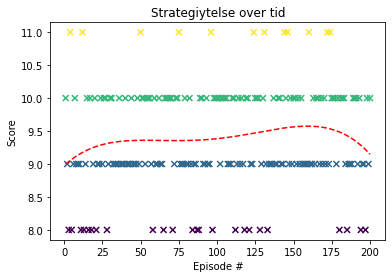

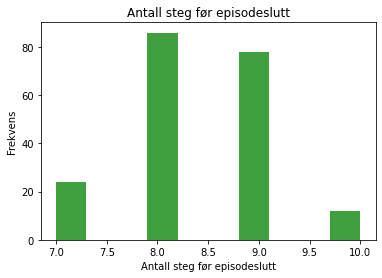

In [11]:
plot_performance(scores)
plot_trials_to_solve(trials_to_solve)

**Oppgave 4d)**
Hent fram videopptaket du har gjort av oppførselen til strategien over tid. Hva skjer?

In [12]:
html = render_mp4('Alltid1.mp4')
HTML(html)

# 7. Noen andre strategier

Den forrige strategien var å alltid respondere med samme svar, uavhengig av hva miljøets tilstand tilsa. Vi kan istedet forsøke å variere mellom 0 og 1. Den aller enkleste måten å variere på er å returnere et tilfeldig svar.

**Oppgave 5:** Implementer en slik strategi. Tegn deretter ut de samme plottene som forrige gang, og inspiser videopptaket. Hvordan er denne strategien sammenlignet med den forrige? Hvorfor?

In [13]:
class Policy_Random():
    def __init__(self):
      pass

    def name(self):
      return "TilfeldigStrategi"

    def act(self, state):
      return np.random.randint(2)

    def update(self):
      pass

    def memorize(self, state, action, reward, done):
      # Explain purpose
      pass

policy = Policy_Random()
scores, trials_to_solve = run_cartPole(policy)
print('** Mean average score:', np.mean(scores))

Evaluerer TilfeldigStrategi
Episode 1	Average Score: 14.00	Steps: 13
Episode 2	Average Score: 13.00	Steps: 11
Episode 3	Average Score: 12.67	Steps: 11
Episode 4	Average Score: 14.50	Steps: 19
Episode 5	Average Score: 16.60	Steps: 24
Episode 6	Average Score: 15.50	Steps: 9
Episode 7	Average Score: 15.86	Steps: 17
Episode 8	Average Score: 15.38	Steps: 11
Episode 9	Average Score: 14.89	Steps: 10
Episode 10	Average Score: 14.90	Steps: 14
Episode 11	Average Score: 18.64	Steps: 55
Episode 12	Average Score: 18.58	Steps: 17
Episode 13	Average Score: 18.00	Steps: 10
Episode 14	Average Score: 18.36	Steps: 22
Episode 15	Average Score: 21.80	Steps: 69
Episode 16	Average Score: 21.06	Steps: 9
Episode 17	Average Score: 20.76	Steps: 15
Episode 18	Average Score: 20.56	Steps: 16
Episode 19	Average Score: 20.53	Steps: 19
Episode 20	Average Score: 20.35	Steps: 16
Episode 21	Average Score: 19.90	Steps: 10
Episode 22	Average Score: 20.32	Steps: 28
Episode 23	Average Score: 20.17	Steps: 16
Episode 24	Averag

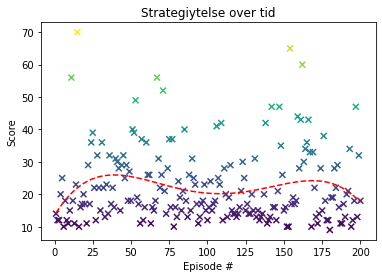

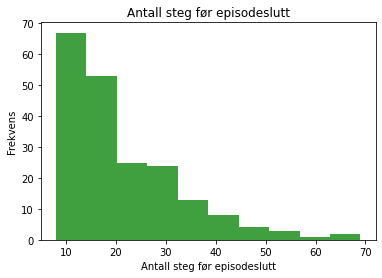

In [14]:
plot_performance(scores)
plot_trials_to_solve(trials_to_solve)

In [15]:
html = render_mp4('TilfeldigStrategi.mp4')
HTML(html)

La oss forsøke å forbedre strategien enda litt mer. Det kan vi gjøre ved å tilpasse handlingen etter hvordan miljøets tilstand er. For eksempel kan vi skyve bilen mot venstre dersom stangen tipper i denne retningen. Og mot høyre hvis den tipper i den retningen.

**Oppgave 6:**
Skriv en slik strategiklasse, `Policy_BasicConditionalBangControl`. Du trenger kun å implementere `act`-funksjonen. Tegn ut de samme plottene som tidligere og inspiser videopptaket. Hvordan er oppførselen til strategien nå?

In [16]:
class Policy_BasicConditionalBangControl():
    def __init__(self):
      pass

    def name(self):
      return "BangControlStrategi"

    def act(self, state):
      observation_angle = state[2]  # Dette er den observerte vinkelen til stangen
      if observation_angle < 0:
        return 0
      else:
        return 1

    def update(self):
      pass

    def memorize(self, state, action, reward, done):
      # Explain purpose
      pass

policy = Policy_BasicConditionalBangControl()
scores, trials_to_solve = run_cartPole(policy)

Evaluerer BangControlStrategi
Episode 1	Average Score: 45.00	Steps: 44
Episode 2	Average Score: 45.50	Steps: 45
Episode 3	Average Score: 44.33	Steps: 41
Episode 4	Average Score: 43.00	Steps: 38
Episode 5	Average Score: 39.60	Steps: 25
Episode 6	Average Score: 40.33	Steps: 43
Episode 7	Average Score: 40.00	Steps: 37
Episode 8	Average Score: 39.50	Steps: 35
Episode 9	Average Score: 40.00	Steps: 43
Episode 10	Average Score: 40.20	Steps: 41
Episode 11	Average Score: 40.18	Steps: 39
Episode 12	Average Score: 40.17	Steps: 39
Episode 13	Average Score: 40.15	Steps: 39
Episode 14	Average Score: 39.86	Steps: 35
Episode 15	Average Score: 39.80	Steps: 38
Episode 16	Average Score: 38.94	Steps: 25
Episode 17	Average Score: 39.65	Steps: 50
Episode 18	Average Score: 38.94	Steps: 26
Episode 19	Average Score: 39.32	Steps: 45
Episode 20	Average Score: 39.15	Steps: 35
Episode 21	Average Score: 39.19	Steps: 39
Episode 22	Average Score: 39.14	Steps: 37
Episode 23	Average Score: 39.70	Steps: 51
Episode 24	Av

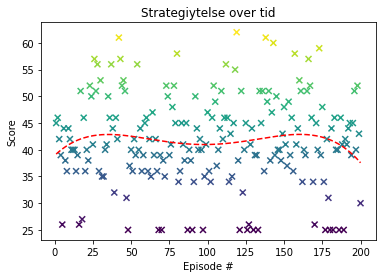

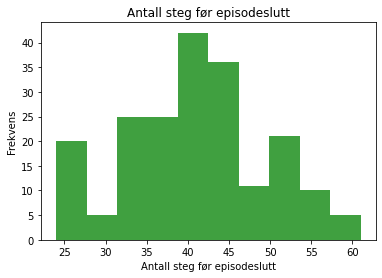

In [17]:
plot_performance(scores)
plot_trials_to_solve(trials_to_solve)

In [ ]:
html = render_mp4('BangControlStrategi.mp4')
HTML(html)

**Oppgave 7:** Kan du komme på en egen strategi for å løse problemet? For eksempel forbedre tilnærmingen over og skrive en `Policy_ImprovedConditionalBangControl`? *Hint*: Her gjelder det å se på andre parametre også, i hovedsak stangens og bilens hastighet.

Du kan hoppe over denne oppgaven hvis du har lyst til å gå videre til en strategi som faktisk løser miljøet.

In [ ]:
class Policy_ImprovedConditionalBangControl():
    def __init__(self):
      pass

    def name(self):
      return "ImprovedBangControlStrategi"

    def act(self, state):
      angle = state[2]  # Dette er den observerte vinkelen til stangen
      angle_vel = state[3] # Dette er stangens vinkelhastighet
      if np.sign(angle * angle_vel) > 0:
        return 1
      else:
        return 0

    def update(self):
      pass

    def memorize(self, state, action, reward, done):
      # Explain purpose
      pass

policy = Policy_ImprovedConditionalBangControl()
scores, trials_to_solve = run_cartPole(policy)

Evaluerer ImprovedBangControlStrategi
Episode 1	Average Score: 200.00	Steps: 199
Episode 2	Average Score: 180.50	Steps: 160
Episode 3	Average Score: 156.00	Steps: 106
Episode 4	Average Score: 153.25	Steps: 144
Episode 5	Average Score: 144.00	Steps: 106
Episode 6	Average Score: 144.83	Steps: 148
Episode 7	Average Score: 147.86	Steps: 165
Episode 8	Average Score: 130.50	Steps: 8
Episode 9	Average Score: 117.00	Steps: 8
Episode 10	Average Score: 106.20	Steps: 8
Episode 11	Average Score: 97.27	Steps: 7
Episode 12	Average Score: 101.58	Steps: 148
Episode 13	Average Score: 94.38	Steps: 7
Episode 14	Average Score: 88.29	Steps: 8
Episode 15	Average Score: 91.47	Steps: 135
Episode 16	Average Score: 92.75	Steps: 111
Episode 17	Average Score: 99.06	Steps: 199
Episode 18	Average Score: 99.50	Steps: 106
Episode 19	Average Score: 94.74	Steps: 8
Episode 20	Average Score: 100.00	Steps: 199
Episode 21	Average Score: 95.62	Steps: 7
Episode 22	Average Score: 99.68	Steps: 184
Episode 23	Average Score: 95.

In [ ]:
html = render_mp4('ImprovedBangControlStrategi.mp4')
HTML(html)

# 8. Hill climbing

For å løse miljøet er en mulig tilnærming å vekte de forskjellige variablene som beskriver tilstanden til miljøet. Med andre ord, vi må prøve å finne vekter `w_1, w_2, w_3 og w_4` (reelle tall) slik at summen

`w_1 * bilens_posisjon + w_2 * bilens_hastighet + w_3 * stangens_vinkel + w_4 * stangens_vinkel_hastighet`

entydig forteller oss om vi skal dytte bilen mot høyre eller venstre. Den enkleste måten å dikotomisere (forklar betydningen til dette ordet?) en slik sum, er å se på om den er positiv eller negativ. Vi kan for eksempel si at dersom summen, for gitte vekter `w_1, ... w_4`, er negativ, så skal vi dytte bilen mot venstre, mens vi skal dytte mot høyre om den er positiv.

**Oppgave 8a)** Skriv en strategiklasse `PolicyReinforcementLearning` som eier en liste `self.w` med fire reelle vekter og som implementerer `act` ved å sjekke om summen gjengitt ovenfor er positiv eller negativ.

**Oppgave 8b)** *Reinforcement learning* betyr at vi søker å belønne riktig atferd i strategiklassen. Det vil si at vi oppdaterer vektene `w_1, ... w_4` i strategiklassen etter hver fullendte episode basert på hvor høy score vi fikk. Var scoren høy tolker vi det som at vektene var "gode" og endrer dem ikke så mye. Var scoren lav tolker vi det som at vektene ikke var så gode, og vi endrer dem da litt mer før neste episode.

Dette betyr at vi er nødt til å ta vare på belønningene vi får for hver episode.Skriv funksjonen `memorize` i strategiklassen slik at den tar vare på belønningene i en liste `self.rewards`.

**Oppgave 8c)** Du skal nå skrive funksjonen `update` slik at den oppdaterer vektene basert på om vi har fått bedre belønning. Hvis belønningen har forbedret seg kan du justere vektene **litt**, mens hvis belønningen har forverret seg må du justere vektene **mye**. *Hint:* Det kan være lurt å gjøre en tilfeldig justering innenfor nevnte størrelsesorden.

**Oppgave 8d)** Prøv å kjøre strategien nå. Fungerer det?

**Oppgave 8e)** For en bedre ytelse kan det være lurt å legge mindre og mindre vekt på nyere belønninger. Dette hindrer læringen til strategien fra å bli overopphengt i de siste resultatene. Vi kan legge til en ny variabel `gamma` og bruke en vektet sum av de foregående belønningene som mål på godt vi har lykkes. Første belønning vektes med `gamma^0 = 1.0`, andre belønning med `gamma`, tredje med `gamma^2`, fjerde med `gamma^3` osv. Forsøk å variere denne variablen (mellom 0 og 1). Hvordan endrer oppførselen til strategilæringen seg?

In [ ]:
class PolicyReinforcementLearning():
    def __init__(self):
        self.rewards = []
        self.best_R = -np.Inf
        self.w = 0.1*np.array([1.0, 1.0, 1.0, 1.0])
        self.best_w = self.w      # Vi initialiserer på trivielt vis
        self.w_history = [self.w] # Historikk over vektene, for visualisering av utvikling over tid
        self.gamma = 0.9         # Rate for nedvekting av belønninger
        self.noise_scale = 1.0e-2 # Standardavvik for additiv støy


    def name(self):
        return "ReinforcementLearning"    

    def act(self, state):
        if np.dot(state, self.w) < 0:
            return 0
        else:
            return 1

    def memorize(self, state, action, reward, done):
        self.rewards.append(reward)

    def update(self):
        discounts = [self.gamma**i for i in range(len(self.rewards)+1)]
        self.R = sum([a*b for a, b in zip(discounts, self.rewards)])

        if self.R >= self.best_R: # Vektene var bedre enn tidligere
            self.best_R = self.R
            self.best_w = self.w
            self.noise_scale = max(1.0e-3, self.noise_scale / 2.0) # Gjør støy mindre, fordi vi gjør fremgang og ikke vil endre så mye på vektene
            self.w += self.noise_scale * np.random.rand(*self.w.shape)
        else: # Vektene var ikke bedre enn før
            self.noise_scale = min(2.0, self.noise_scale * 2.0) # Gjør støy større fordi vi feiler og trenger større justering v vektene
            self.w = self.best_w + self.noise_scale * np.random.rand(*self.w.shape)

        self.w_history.append(self.w)
        self.rewards = []


policy = PolicyReinforcementLearning()
scores, trials_to_solve = run_cartPole(policy)
print('** Mean average score:', np.mean(scores))

Evaluerer ReinforcementLearning
Episode 1	Average Score: 200.00	Steps: 199
Episode 2	Average Score: 200.00	Steps: 199
Episode 3	Average Score: 177.33	Steps: 131
Episode 4	Average Score: 160.00	Steps: 107
Episode 5	Average Score: 149.00	Steps: 104
Episode 6	Average Score: 157.50	Steps: 199
Episode 7	Average Score: 158.43	Steps: 163
Episode 8	Average Score: 157.38	Steps: 149
Episode 9	Average Score: 158.56	Steps: 167
Episode 10	Average Score: 158.40	Steps: 156
Episode 11	Average Score: 162.18	Steps: 199
Episode 12	Average Score: 165.33	Steps: 199
Episode 13	Average Score: 168.00	Steps: 199
Episode 14	Average Score: 170.29	Steps: 199
Episode 15	Average Score: 170.07	Steps: 166
Episode 16	Average Score: 171.94	Steps: 199
Episode 17	Average Score: 173.59	Steps: 199
Episode 18	Average Score: 175.06	Steps: 199
Episode 19	Average Score: 176.37	Steps: 199
Episode 20	Average Score: 177.55	Steps: 199
Episode 21	Average Score: 178.62	Steps: 199
Episode 22	Average Score: 179.59	Steps: 199
Episode 2

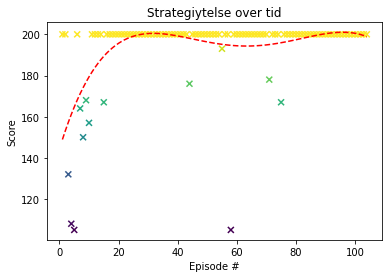

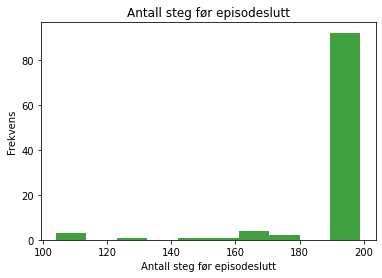

In [ ]:
plot_performance(scores)
plot_trials_to_solve(trials_to_solve)

In [ ]:
html = render_mp4('ReinforcementLearning.mp4')
HTML(html)

**Oppgave 8f)** Se på videopptaket av strategiens oppførsel. Hva synes du?

**Oppgave 8g)** Ta vare på vektene som genereres av strategiklassen underveis. Skriv en funksjon `plot_weights_history` som tegner utviklingen til hver av dem som funksjon av antall episoder. Hva observerer du?

In [ ]:
def plot_weights_history(weights_history):
    weights_history = np.array(weights_history)
    plt.figure(0)
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=1.6, hspace=.5)
    i = 0
    for obs_id in range(weights_history.shape[1]):  # Loop through state parameters
        plt.subplot(2, 2, i + 1)
        i += 1
        # plt.axis('off')
        plt.plot(weights_history[:, obs_id])
        plt.title('Vekt for miljøtilstandsparameter {}'.format(obs_id))

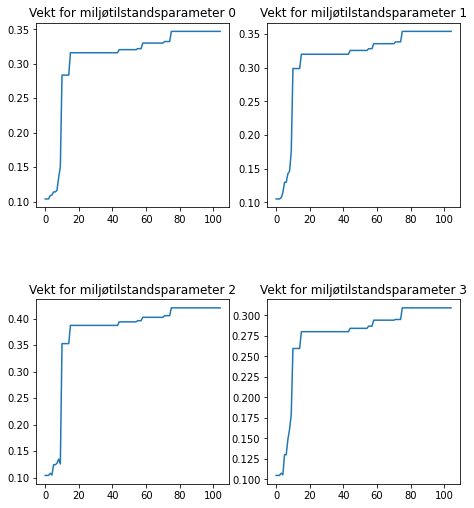

In [ ]:
plot_weights_history(policy.w_history)

**Kommentar:** Det er mulig å lage en enda bedre utgave av klassen over ved å finpusse tilnærmingen til `act`, som indikert nedenfor. Men dette forutsetter enda litt mer avanserte matematikkunnskaper.

In [ ]:
class PolicyImprovedReinforcementLearning():
    def __init__(self, state_space_dim=4, action_space_dim=2):
        self.rewards = []
        self.best_R = -np.Inf
        self.w = 1e-4 * np.ones((state_space_dim, action_space_dim))
        self.best_w = self.w
        self.w_history = [self.w]
        self.gamma = 0.95         # Rate for nedvekting av belønninger
        self.noise_scale = 1.0e-2 # Standardavvik for additiv støy

    def name(self):
        return "ImprovedRL"

    def _probas(self, state):
        x = np.dot(state, self.w)
        return np.exp(x) / sum(np.exp(x))

    def act(self, state):
        probas = self._probas(state)
        action = np.argmax(probas)
        return action

    def memorize(self, next_state, action, reward, done):
        self.rewards.append(reward)

    def update(self):
        discounts = [self.gamma**i for i in range(len(self.rewards)+1)]
        self.R = sum([a*b for a,b in zip(discounts, self.rewards)])

        if self.R >= self.best_R:
            self.best_R = self.R
            self.best_w = self.w
            self.noise_scale = max(1.0e-3, self.noise_scale / 2.0)
            self.w += self.noise_scale * np.random.rand(*self.w.shape)
        else:
            self.noise_scale = min(2.0, self.noise_scale * 2.0)
            self.w = self.best_w + self.noise_scale * np.random.rand(*self.w.shape)

        self.w_history.append(self.w)
        self.rewards = []

policy = PolicyImprovedReinforcementLearning()
scores, trials_to_solve = run_cartPole(policy)
print('** Mean average score:', np.mean(scores))

Evaluerer ImprovedRL
Episode 1	Average Score: 9.00	Steps: 8
Episode 2	Average Score: 104.50	Steps: 199
Episode 3	Average Score: 96.00	Steps: 78
Episode 4	Average Score: 93.50	Steps: 85
Episode 5	Average Score: 88.00	Steps: 65
Episode 6	Average Score: 74.83	Steps: 8
Episode 7	Average Score: 68.14	Steps: 27
Episode 8	Average Score: 61.25	Steps: 12
Episode 9	Average Score: 55.56	Steps: 9
Episode 10	Average Score: 50.90	Steps: 8
Episode 11	Average Score: 48.64	Steps: 25
Episode 12	Average Score: 45.25	Steps: 7
Episode 13	Average Score: 42.62	Steps: 10
Episode 14	Average Score: 44.93	Steps: 74
Episode 15	Average Score: 51.87	Steps: 148
Episode 16	Average Score: 49.69	Steps: 16
Episode 17	Average Score: 55.47	Steps: 147
Episode 18	Average Score: 59.44	Steps: 126
Episode 19	Average Score: 60.00	Steps: 69
Episode 20	Average Score: 67.00	Steps: 199
Episode 21	Average Score: 64.19	Steps: 7
Episode 22	Average Score: 62.36	Steps: 23
Episode 23	Average Score: 60.04	Steps: 8
Episode 24	Average Score

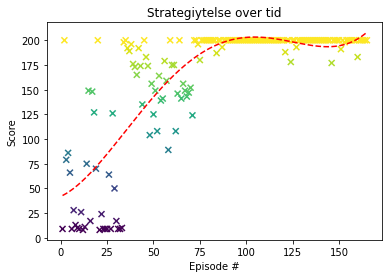

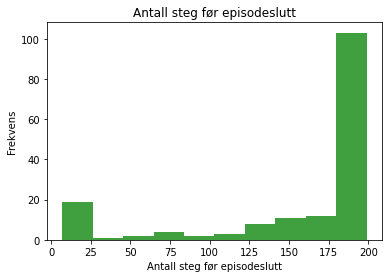

In [ ]:
plot_performance(scores)
plot_trials_to_solve(trials_to_solve)

In [ ]:
html = render_mp4("ImprovedRL.mp4")
HTML(html)

# 9. Trene en modell ved hjelp av ray.rllib

Det vi nå har gjort er å lage vår egen, helt grunnleggende *reinforcement learning*-algoritme, spesialtilpasset et konkret problem, med forholdsvis enkel matematikk. Det finnes mer generelle tilnærminger, som tar i bruk kraftigere matematiske verktøy og enkelt kan tilpasses andre problemer. For eksempel kan man benytte Rays bibliotek RLLib. Vi må da først installere biblioteket:

In [ ]:
!pip install 'ray[rllib]'

     |████████████████████████████████| 59.6 MB 1.3 MB/s 
     |████████████████████████████████| 175 kB 59.0 MB/s 
     |████████████████████████████████| 125 kB 58.8 MB/s 
     |████████████████████████████████| 1.2 MB 47.6 MB/s 


RLLib er ferdig tilpasset gym.openai.

In [ ]:
config = {                        # Det er mulig å modifisere konfigurasjonen - se https://docs.ray.io/en/latest/rllib-models.html
    "env": "CartPole-v0",         # Med dette forteller vi RLLib at vi jobber med CartPole-v0-miljøet som biblioteket allerede kjenner til
    "framework": "torch",         # Spesifiser hvilket maskinlæringsrammeverk som skal benyttes (PyTorch = "torch", Tensorflow = "tf")
    "model": {                    # Spesifiserer egenskaper ved det nevrale nettverket som skal benyttes til læring (se f.eks. https://en.wikipedia.org/wiki/Artificial_neural_network)
      "fcnet_hiddens": [32],      # Antall "hidden layers" i det nevrale nettverket
      "fcnet_activation": "linear"# Aktiveringsfunksjon, kan også være "tanh" (https://en.wikipedia.org/wiki/Hyperbolic_functions#Tanh), "relu" (https://en.wikipedia.org/wiki/Rectifier_(neural_networks)) eller "linear"
    }
}  

In [ ]:
import ray
from ray.rllib.agents.ppo import PPOTrainer

ray.shutdown()                        # Stop eventuelle instanser
ray.init(                             # Sett opp ny instans med visse parametre
    num_cpus = 3,
    include_dashboard = False,
    ignore_reinit_error = True,
    log_to_driver = False,
)
# https://docs.ray.io/en/latest/tune/api_docs/execution.html
analysis = ray.tune.run(              # Begynn trening
    "PPO",                            # Valg av innebygd treningsalgoritme
    config = config,                  # Konfigurasjon
    stop = { 
        "episode_reward_mean": 195    # Vi stopper treningen når snitt-belønning går over 195
    },                        
    checkpoint_at_end = True,         # Må tas vare på for gjenbruk etterpå
    verbose = 2                       # Hvor mye rapporteringer skal vi ha underveis i treningen?
)

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=71.0,episode_reward_min=9.0,episode_reward_mean=21.88950276243094,episode_len_mean=21.88950276243094,episode_media={},episodes_this_iter=181,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.19524948875955583, 'mean_inference_ms': 1.4268092777144208, 'mean_action_processing_ms': 0.09309174252655207, 'mean_env_wait_ms': 0.11604169767708489, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=4000,timers={'sample_time_ms': 5079.395, 'sample_throughput': 787.495, 'load_time_ms': 0.458, 'load_throughput': 8742686.816, 'learn_time_ms': 3205.61, 'learn_throughput': 1247.813, 'update_time_ms': 2.267},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 220.31587714738743, 'poli

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=117.0,episode_reward_min=10.0,episode_reward_mean=30.21969696969697,episode_len_mean=30.21969696969697,episode_media={},episodes_this_iter=132,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.19163710667989078, 'mean_inference_ms': 1.44174941251527, 'mean_action_processing_ms': 0.09400832312932658, 'mean_env_wait_ms': 0.11735724923224854, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=8000,timers={'sample_time_ms': 6078.905, 'sample_throughput': 658.013, 'load_time_ms': 0.476, 'load_throughput': 8409632.08, 'learn_time_ms': 3724.803, 'learn_throughput': 1073.882, 'update_time_ms': 4.351},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 439.2821190126481, 'polic

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=148.0,episode_reward_min=10.0,episode_reward_mean=37.12844036697248,episode_len_mean=37.12844036697248,episode_media={},episodes_this_iter=109,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.20779254989943738, 'mean_inference_ms': 1.5957733588534198, 'mean_action_processing_ms': 0.09813164033709547, 'mean_env_wait_ms': 0.13080558915887927, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=12000,timers={'sample_time_ms': 7231.969, 'sample_throughput': 553.1, 'load_time_ms': 0.728, 'load_throughput': 5495921.38, 'learn_time_ms': 3834.451, 'learn_throughput': 1043.174, 'update_time_ms': 3.764},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.20000000000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 510.4731917350523, 'poli

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=143.0,episode_reward_min=11.0,episode_reward_mean=49.63,episode_len_mean=49.63,episode_media={},episodes_this_iter=71,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.2021323451685972, 'mean_inference_ms': 1.5639600358285932, 'mean_action_processing_ms': 0.09782533487361539, 'mean_env_wait_ms': 0.12858320919519511, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=16000,timers={'sample_time_ms': 7353.25, 'sample_throughput': 543.977, 'load_time_ms': 0.669, 'load_throughput': 5977985.391, 'learn_time_ms': 3689.072, 'learn_throughput': 1084.283, 'update_time_ms': 3.487},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.10000000000000002, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1063.8911975819578, 'policy_loss': -0.0149059904

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=12.0,episode_reward_mean=72.81,episode_len_mean=72.81,episode_media={},episodes_this_iter=41,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.19663917699541514, 'mean_inference_ms': 1.526323816533751, 'mean_action_processing_ms': 0.09656421630422382, 'mean_env_wait_ms': 0.12574344522279168, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=20000,timers={'sample_time_ms': 7241.934, 'sample_throughput': 552.339, 'load_time_ms': 0.634, 'load_throughput': 6308647.063, 'learn_time_ms': 3629.115, 'learn_throughput': 1102.197, 'update_time_ms': 3.307},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.05000000000000001, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1621.2916346396169, 'policy_loss': -0.011439905

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=14.0,episode_reward_mean=93.83,episode_len_mean=93.83,episode_media={},episodes_this_iter=36,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.19274532183088686, 'mean_inference_ms': 1.5076205975914354, 'mean_action_processing_ms': 0.0959079379540216, 'mean_env_wait_ms': 0.12465779443457492, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=24000,timers={'sample_time_ms': 7202.822, 'sample_throughput': 555.338, 'load_time_ms': 0.605, 'load_throughput': 6607804.647, 'learn_time_ms': 3593.596, 'learn_throughput': 1113.091, 'update_time_ms': 3.14},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.025000000000000005, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1461.0118803619057, 'policy_loss': -0.010940200

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=16.0,episode_reward_mean=114.77,episode_len_mean=114.77,episode_media={},episodes_this_iter=28,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.18858518269699132, 'mean_inference_ms': 1.4856004489711017, 'mean_action_processing_ms': 0.0949962056445284, 'mean_env_wait_ms': 0.1227789591784289, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=28000,timers={'sample_time_ms': 7188.71, 'sample_throughput': 556.428, 'load_time_ms': 0.583, 'load_throughput': 6859842.991, 'learn_time_ms': 3547.53, 'learn_throughput': 1127.545, 'update_time_ms': 2.991},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.012500000000000002, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1791.7288576843919, 'policy_loss': -0.010588847

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=19.0,episode_reward_mean=132.83,episode_len_mean=132.83,episode_media={},episodes_this_iter=22,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.18623372270203808, 'mean_inference_ms': 1.4768772521066689, 'mean_action_processing_ms': 0.09476890348841717, 'mean_env_wait_ms': 0.12206874851353686, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=32000,timers={'sample_time_ms': 7151.16, 'sample_throughput': 559.35, 'load_time_ms': 0.586, 'load_throughput': 6823820.631, 'learn_time_ms': 3507.277, 'learn_throughput': 1140.486, 'update_time_ms': 2.992},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.006250000000000001, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 2019.0938833585349, 'policy_loss': -0.0088515

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=25.0,episode_reward_mean=151.76,episode_len_mean=151.76,episode_media={},episodes_this_iter=22,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.18355551073337878, 'mean_inference_ms': 1.4658978489863488, 'mean_action_processing_ms': 0.09427758458691587, 'mean_env_wait_ms': 0.12091020191433483, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=36000,timers={'sample_time_ms': 7117.175, 'sample_throughput': 562.021, 'load_time_ms': 0.568, 'load_throughput': 7043988.804, 'learn_time_ms': 3482.577, 'learn_throughput': 1148.575, 'update_time_ms': 3.341},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.0031250000000000006, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 2082.6472298570857, 'policy_loss': -0.0093

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=25.0,episode_reward_mean=167.21,episode_len_mean=167.21,episode_media={},episodes_this_iter=22,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.18132117875199177, 'mean_inference_ms': 1.458172756192263, 'mean_action_processing_ms': 0.09390197840121565, 'mean_env_wait_ms': 0.12014120684150004, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=40000,timers={'sample_time_ms': 7105.703, 'sample_throughput': 562.928, 'load_time_ms': 0.554, 'load_throughput': 7215696.529, 'learn_time_ms': 3457.074, 'learn_throughput': 1157.048, 'update_time_ms': 3.234},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.0015625000000000003, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1582.770664141255, 'policy_loss': -0.011645

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=25.0,episode_reward_mean=177.21,episode_len_mean=177.21,episode_media={},episodes_this_iter=24,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17922635216203595, 'mean_inference_ms': 1.45009756482067, 'mean_action_processing_ms': 0.0936328042048887, 'mean_env_wait_ms': 0.11951676848836298, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=44000,timers={'sample_time_ms': 7280.303, 'sample_throughput': 549.428, 'load_time_ms': 0.584, 'load_throughput': 6847284.303, 'learn_time_ms': 3456.629, 'learn_throughput': 1157.197, 'update_time_ms': 3.259},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.0007812500000000002, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1794.401045998194, 'policy_loss': -0.00954075

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=26.0,episode_reward_mean=178.7,episode_len_mean=178.7,episode_media={},episodes_this_iter=23,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17759531645824986, 'mean_inference_ms': 1.4437135135426677, 'mean_action_processing_ms': 0.09346931803492321, 'mean_env_wait_ms': 0.11900706547109699, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=48000,timers={'sample_time_ms': 7265.497, 'sample_throughput': 550.547, 'load_time_ms': 0.583, 'load_throughput': 6856518.861, 'learn_time_ms': 3358.52, 'learn_throughput': 1191.001, 'update_time_ms': 2.945},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.0003906250000000001, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1786.2019026889595, 'policy_loss': -0.0141510

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=26.0,episode_reward_mean=172.69,episode_len_mean=172.69,episode_media={},episodes_this_iter=24,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17637284249154647, 'mean_inference_ms': 1.4390818676625525, 'mean_action_processing_ms': 0.09334566105158473, 'mean_env_wait_ms': 0.11858390804745772, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=52000,timers={'sample_time_ms': 7011.249, 'sample_throughput': 570.512, 'load_time_ms': 0.501, 'load_throughput': 7980410.027, 'learn_time_ms': 3277.43, 'learn_throughput': 1220.468, 'update_time_ms': 2.897},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 0.00019531250000000004, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1224.2653106689454, 'policy_loss': -0.0076

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=48.0,episode_reward_mean=174.96,episode_len_mean=174.96,episode_media={},episodes_this_iter=21,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17548758014608676, 'mean_inference_ms': 1.436277510510085, 'mean_action_processing_ms': 0.09336611288176279, 'mean_env_wait_ms': 0.11825886710048282, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=56000,timers={'sample_time_ms': 6933.827, 'sample_throughput': 576.882, 'load_time_ms': 0.504, 'load_throughput': 7929115.743, 'learn_time_ms': 3286.32, 'learn_throughput': 1217.167, 'update_time_ms': 2.944},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 9.765625000000002e-05, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1361.5006175051453, 'policy_loss': -0.008528

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=48.0,episode_reward_mean=175.5,episode_len_mean=175.5,episode_media={},episodes_this_iter=21,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17470835140118385, 'mean_inference_ms': 1.4348979294273112, 'mean_action_processing_ms': 0.09340818238178165, 'mean_env_wait_ms': 0.118011379884801, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=60000,timers={'sample_time_ms': 6969.635, 'sample_throughput': 573.918, 'load_time_ms': 0.503, 'load_throughput': 7946391.323, 'learn_time_ms': 3295.534, 'learn_throughput': 1213.764, 'update_time_ms': 3.314},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 4.882812500000001e-05, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1168.041885835381, 'policy_loss': -0.007883201

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=49.0,episode_reward_mean=178.41,episode_len_mean=178.41,episode_media={},episodes_this_iter=23,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17421500679918647, 'mean_inference_ms': 1.4370111473748384, 'mean_action_processing_ms': 0.09357434430247508, 'mean_env_wait_ms': 0.11792345310880677, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=64000,timers={'sample_time_ms': 7059.509, 'sample_throughput': 566.612, 'load_time_ms': 0.509, 'load_throughput': 7861863.168, 'learn_time_ms': 3550.52, 'learn_throughput': 1126.595, 'update_time_ms': 3.307},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 2.4414062500000005e-05, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1319.259939821305, 'policy_loss': -0.00794

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=49.0,episode_reward_mean=185.41,episode_len_mean=185.41,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17374331366843884, 'mean_inference_ms': 1.4382304226040241, 'mean_action_processing_ms': 0.09371420888152543, 'mean_env_wait_ms': 0.11786531087176882, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=68000,timers={'sample_time_ms': 7306.619, 'sample_throughput': 547.449, 'load_time_ms': 0.505, 'load_throughput': 7917889.471, 'learn_time_ms': 3548.918, 'learn_throughput': 1127.104, 'update_time_ms': 3.369},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 1.2207031250000002e-05, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 974.6953104654948, 'policy_loss': -0.0060

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=66.0,episode_reward_mean=189.5,episode_len_mean=189.5,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17349208828050663, 'mean_inference_ms': 1.4411224225707235, 'mean_action_processing_ms': 0.09391304054750639, 'mean_env_wait_ms': 0.1179140278575323, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=72000,timers={'sample_time_ms': 7352.092, 'sample_throughput': 544.063, 'load_time_ms': 0.509, 'load_throughput': 7863337.083, 'learn_time_ms': 3560.574, 'learn_throughput': 1123.414, 'update_time_ms': 3.298},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 6.103515625000001e-06, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 872.4842004591419, 'policy_loss': -0.00536813

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=66.0,episode_reward_mean=187.42,episode_len_mean=187.42,episode_media={},episodes_this_iter=23,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17352253298336326, 'mean_inference_ms': 1.4455922847674227, 'mean_action_processing_ms': 0.09421138640445437, 'mean_env_wait_ms': 0.11800950363478017, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=76000,timers={'sample_time_ms': 7399.864, 'sample_throughput': 540.55, 'load_time_ms': 0.513, 'load_throughput': 7796828.702, 'learn_time_ms': 3591.033, 'learn_throughput': 1113.886, 'update_time_ms': 2.899},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 3.0517578125000006e-06, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 960.7409527194116, 'policy_loss': -0.01303

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=102.0,episode_reward_mean=189.71,episode_len_mean=189.71,episode_media={},episodes_this_iter=21,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17345902228062562, 'mean_inference_ms': 1.4481268992835583, 'mean_action_processing_ms': 0.094352258357782, 'mean_env_wait_ms': 0.11803207764291003, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=80000,timers={'sample_time_ms': 7415.25, 'sample_throughput': 539.429, 'load_time_ms': 0.521, 'load_throughput': 7672390.36, 'learn_time_ms': 3605.548, 'learn_throughput': 1109.401, 'update_time_ms': 2.889},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 1.5258789062500003e-06, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 1044.705285742975, 'policy_loss': -0.0092684

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=102.0,episode_reward_mean=191.21,episode_len_mean=191.21,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17325128576670387, 'mean_inference_ms': 1.4479514790216017, 'mean_action_processing_ms': 0.09437054561782855, 'mean_env_wait_ms': 0.11788970940865827, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=84000,timers={'sample_time_ms': 7432.559, 'sample_throughput': 538.173, 'load_time_ms': 0.489, 'load_throughput': 8184007.805, 'learn_time_ms': 3615.439, 'learn_throughput': 1106.366, 'update_time_ms': 2.866},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 7.629394531250001e-07, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 907.0554638606246, 'policy_loss': -0.0041

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=102.0,episode_reward_mean=189.92,episode_len_mean=189.92,episode_media={},episodes_this_iter=21,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.1730215181243564, 'mean_inference_ms': 1.4476896203300282, 'mean_action_processing_ms': 0.09435760685836612, 'mean_env_wait_ms': 0.1177647904696831, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=88000,timers={'sample_time_ms': 7431.893, 'sample_throughput': 538.221, 'load_time_ms': 0.481, 'load_throughput': 8318730.662, 'learn_time_ms': 3629.45, 'learn_throughput': 1102.095, 'update_time_ms': 2.782},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 3.814697265625001e-07, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 736.1279805501302, 'policy_loss': -0.0027765

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=102.0,episode_reward_mean=189.25,episode_len_mean=189.25,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17261182093956562, 'mean_inference_ms': 1.445336849722804, 'mean_action_processing_ms': 0.09428375243188515, 'mean_env_wait_ms': 0.11753457817649249, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=92000,timers={'sample_time_ms': 7428.645, 'sample_throughput': 538.456, 'load_time_ms': 0.485, 'load_throughput': 8254472.817, 'learn_time_ms': 3627.782, 'learn_throughput': 1102.602, 'update_time_ms': 2.831},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 1.9073486328125004e-07, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 771.6685225948211, 'policy_loss': -0.0023

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=47.0,episode_reward_mean=192.38,episode_len_mean=192.38,episode_media={},episodes_this_iter=21,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17204914290632412, 'mean_inference_ms': 1.4416709816601578, 'mean_action_processing_ms': 0.09414739677912848, 'mean_env_wait_ms': 0.11730883651742431, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=96000,timers={'sample_time_ms': 7418.461, 'sample_throughput': 539.195, 'load_time_ms': 0.475, 'load_throughput': 8418916.098, 'learn_time_ms': 3612.388, 'learn_throughput': 1107.301, 'update_time_ms': 2.732},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 9.536743164062502e-08, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 781.873537617345, 'policy_loss': -0.003442

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=47.0,episode_reward_mean=192.37,episode_len_mean=192.37,episode_media={},episodes_this_iter=22,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.1715440932258494, 'mean_inference_ms': 1.4385646489334354, 'mean_action_processing_ms': 0.09400903193985456, 'mean_env_wait_ms': 0.11710792327436588, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=100000,timers={'sample_time_ms': 7381.471, 'sample_throughput': 541.897, 'load_time_ms': 0.47, 'load_throughput': 8503834.964, 'learn_time_ms': 3603.245, 'learn_throughput': 1110.111, 'update_time_ms': 2.326},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 4.768371582031251e-08, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 635.5014351465369, 'policy_loss': -0.001511

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=47.0,episode_reward_mean=191.39,episode_len_mean=191.39,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17110448492476876, 'mean_inference_ms': 1.4358786694931331, 'mean_action_processing_ms': 0.093900184833282, 'mean_env_wait_ms': 0.11695182202472434, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=104000,timers={'sample_time_ms': 7287.888, 'sample_throughput': 548.856, 'load_time_ms': 0.464, 'load_throughput': 8627148.66, 'learn_time_ms': 3340.453, 'learn_throughput': 1197.442, 'update_time_ms': 2.327},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 2.3841857910156255e-08, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 528.8552333380586, 'policy_loss': -0.000821

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=47.0,episode_reward_mean=192.57,episode_len_mean=192.57,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17069402232784106, 'mean_inference_ms': 1.433279603155473, 'mean_action_processing_ms': 0.09379533091751524, 'mean_env_wait_ms': 0.11678797048499158, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=108000,timers={'sample_time_ms': 7025.197, 'sample_throughput': 569.379, 'load_time_ms': 0.468, 'load_throughput': 8552822.186, 'learn_time_ms': 3343.118, 'learn_throughput': 1196.488, 'update_time_ms': 2.285},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 1.1920928955078127e-08, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 743.2857224823326, 'policy_loss': -0.0035

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=47.0,episode_reward_mean=194.11,episode_len_mean=194.11,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17097886397169965, 'mean_inference_ms': 1.436085910257047, 'mean_action_processing_ms': 0.0940422940689565, 'mean_env_wait_ms': 0.11688889744933494, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=112000,timers={'sample_time_ms': 7203.723, 'sample_throughput': 555.268, 'load_time_ms': 0.475, 'load_throughput': 8416382.061, 'learn_time_ms': 3778.643, 'learn_throughput': 1058.581, 'update_time_ms': 2.317},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 5.960464477539064e-09, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 728.6903297670426, 'policy_loss': -0.002003

Trial PPO_CartPole-v0_10950_00000 reported episode_reward_max=200.0,episode_reward_min=84.0,episode_reward_mean=195.55,episode_len_mean=195.55,episode_media={},episodes_this_iter=20,policy_reward_min={},policy_reward_max={},policy_reward_mean={},custom_metrics={},sampler_perf={'mean_raw_obs_processing_ms': 0.17193371920609793, 'mean_inference_ms': 1.4448485532548283, 'mean_action_processing_ms': 0.09454929299763964, 'mean_env_wait_ms': 0.11738072469859649, 'mean_env_render_ms': 0.0},off_policy_estimator={},num_healthy_workers=2,timesteps_this_iter=4000,agent_timesteps_total=116000,timers={'sample_time_ms': 7856.686, 'sample_throughput': 509.12, 'load_time_ms': 0.555, 'load_throughput': 7206398.351, 'learn_time_ms': 4097.057, 'learn_throughput': 976.311, 'update_time_ms': 3.05},info={'learner': {'default_policy': {'learner_stats': {'allreduce_latency': 0.0, 'cur_kl_coeff': 2.980232238769532e-09, 'cur_lr': 5.0000000000000016e-05, 'total_loss': 790.7585201796664, 'policy_loss': -0.0047329

Trial name,status,loc,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
PPO_CartPole-v0_10950_00000,TERMINATED,172.28.0.2:1726,29,222.774,116000,195.55,200,84,195.55


2022-03-03 11:11:03,464	INFO tune.py:636 -- Total run time: 236.15 seconds (235.76 seconds for the tuning loop).


In [ ]:
# Etter å trent ferdig kan vi hente ut beste resultat
trial = analysis.get_best_logdir("episode_reward_mean", "max")
checkpoint = analysis.get_best_checkpoint(
    trial,
    "training_iteration",
    "max"
)
trainer = PPOTrainer(config=config)
trainer.restore(checkpoint)

2022-03-03 11:11:38,466	WARNING util.py:55 -- Install gputil for GPU system monitoring.
2022-03-03 11:11:38,481	INFO trainable.py:473 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/PPO/PPO_CartPole-v0_10950_00000_0_2022-03-03_11-07-07/checkpoint_000029/checkpoint-29
2022-03-03 11:11:38,498	INFO trainable.py:480 -- Current state after restoring: {'_iteration': 29, '_timesteps_total': 116000, '_time_total': 222.774400472641, '_episodes_total': 1068}


In [ ]:
vid = VideoRecorder(env, "RLLibTrening.mp4")
observation = env.reset()
done = False
while not done:
  env.render()
  vid.capture_frame()
  action = trainer.compute_action(observation)
  observation, reward, done, info = env.step(action)
vid.close()
env.close()

2022-03-03 11:11:49,539	WARNING deprecation.py:46 -- DeprecationWarning: `compute_action` has been deprecated. Use `Trainer.compute_single_action()` instead. This will raise an error in the future!


In [ ]:
html = render_mp4("RLLibTrening.mp4")
HTML(html)

**Oppgave 10:** Eksperimenter med å endre konfigurasjonsinnstillinger på treningen av RLLib, hvordan påvirker det sluttresultatet?